## Import Libraries:

In [1]:
!pip install ultralytics

**Keterangan**:

`!pip install ultralytics`: Perintah yang digunakan untuk menginstal library `ultralytics` menggunakan pip, yang merupakan package manager untuk Python. Tanda seru (!) di depan perintah menunjukkan bahwa ini adalah perintah shell yang dijalankan dari dalam notebook, seperti Jupyter Notebook atau Google Colab.

`Ultralytics`: Perusahaan yang mengembangkan YOLO (You Only Look Once), sebuah framework untuk object detection. YOLOv8 adalah versi terbaru dari framework tersebut, yang terkenal karena kecepatan dan akurasi deteksinya.

Berikut adalah langkah-langkah yang terjadi ketika menjalankan code tersebut:
- Package Manager: pip adalah package manager yang digunakan untuk menginstal dan mengelola paket dan dependensi Python.
- Install Ultralytics: Perintah install ultralytics akan mengunduh dan menginstal paket ultralytics dari Python Package Index (PyPI), bersama dengan semua dependensi yang diperlukan.
- Library Ultralytics ini biasanya digunakan untuk memudahkan pengguna dalam mengimplementasikan model YOLO (seperti YOLOv5, YOLOv8, dll) untuk tugas-tugas object detection dan computer vision lainnya.

In [2]:
import os # Library standar untuk berinteraksi dengan sistem operasi, seperti mengelola file dan direktori.
import shutil # Library standar untuk operasi tingkat tinggi pada file dan koleksi file, seperti menyalin dan menghapus.
import json # Library standar untuk bekerja dengan data JSON (JavaScript Object Notation).
import numpy as np # Library untuk komputasi numerik dengan dukungan array multidimensi dan berbagai fungsi matematika.
import pandas as pd # Library untuk manipulasi dan analisis data, terutama data dalam bentuk tabel (DataFrame).
import matplotlib.pyplot as plt # Submodule dari Matplotlib untuk membuat plot dan visualisasi data.
import matplotlib.image as img # Submodule dari Matplotlib untuk membaca dan menampilkan gambar.
import matplotlib.patches as patches # Submodule dari Matplotlib untuk membuat berbagai bentuk (seperti kotak atau lingkaran) pada plot.
import ultralytics # Library untuk bekerja dengan model YOLO (You Only Look Once) yang dikembangkan oleh Ultralytics untuk tugas deteksi objek.
import yaml # Library untuk membaca dan menulis file YAML (YAML Ain't Markup Language), sering digunakan untuk konfigurasi.

import warnings # Library standar untuk mengontrol peringatan yang muncul selama eksekusi program.
warnings.filterwarnings("ignore") # Menyembunyikan semua peringatan agar tidak mengganggu output program.

## Predict:

#### 1. Deteksi pada Gambar:

In [3]:
import cv2 
from ultralytics import YOLO

In [4]:
# Memuat model yang sudah dilatih sebelumnya (yolov8m.pt):
model = YOLO('/kaggle/input/yolov8m-pretrain-without-train/other/coco2017datasetpersontracking/1/yolov8m.pt')
test_img_name_list = os.listdir('/kaggle/input/coco-2017-dataset/coco2017/test2017')[:20]
test_img_list = [os.path.join('/kaggle/input/coco-2017-dataset/coco2017/test2017', i) for i in test_img_name_list]

In [5]:
# Output Directory:
output_img_dir = '/kaggle/working/yolov8m_no_train_images'
os.makedirs(output_img_dir, exist_ok = True)

In [6]:
# Loop untuk melakukan Prediksi:
for img_path in test_img_list:
    img = cv2.imread(img_path)
    results = model(img)
    
    for result in results:
        if result.boxes is not None:
            person_boxes = result.boxes[result.boxes.cls == 0]
            if person_boxes.shape[0] > 0:
                for box in person_boxes:
                    x1, y1, x2, y2 = [int(coord) for coord in box.xyxy.cpu().numpy()[0]]
                    confidence = box.conf.cpu().numpy()[0]
                    # Menggambar bounding box pada gambar dengan warna merah:
                    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
                    
                    # Menambahkan latar belakang untuk teks:
                    text = f'{confidence:.2f}'
                    (w, h), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
                    cv2.rectangle(img, (x1, y1 - 25), (x1 + w, y1), (0, 0, 255), -1)
                    
                    # Menambahkan teks pada gambar:
                    cv2.putText(img, text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
    
    # Menyimpan gambar hasil deteksi:
    output_img_path = os.path.join(output_img_dir, os.path.basename(img_path))
    cv2.imwrite(output_img_path, img)


0: 480x640 1 bench, 86.3ms
Speed: 4.0ms preprocess, 86.3ms inference, 156.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 2 persons, 3 cars, 1 motorcycle, 1 truck, 1 kite, 28.4ms
Speed: 2.8ms preprocess, 28.4ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 3 forks, 2 knifes, 1 pizza, 101.2ms
Speed: 2.2ms preprocess, 101.2ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 2 persons, 2 scissorss, 91.3ms
Speed: 4.9ms preprocess, 91.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)

0: 352x640 2 persons, 1 sandwich, 88.7ms
Speed: 1.8ms preprocess, 88.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)

0: 448x640 4 persons, 1 airplane, 28.1ms
Speed: 2.2ms preprocess, 28.1ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

0: 640x448 2 persons, 1 cell phone, 28.2ms
Speed: 1.7ms preprocess, 28.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)

0

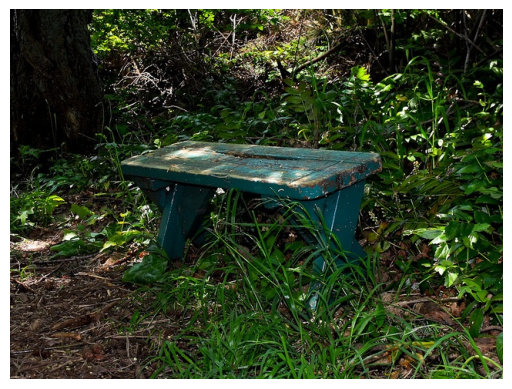

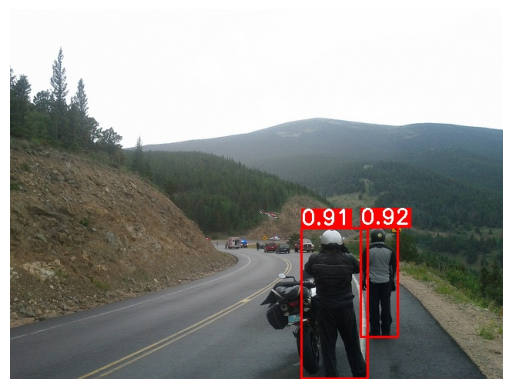

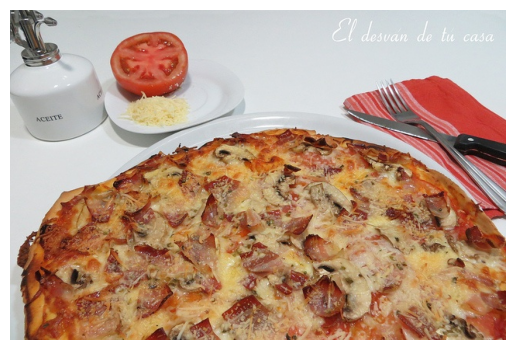

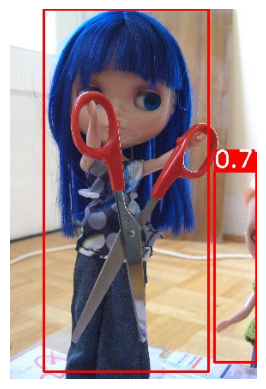

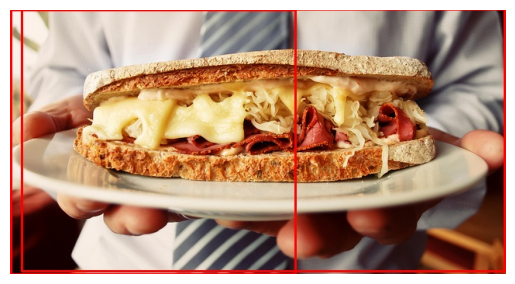

...

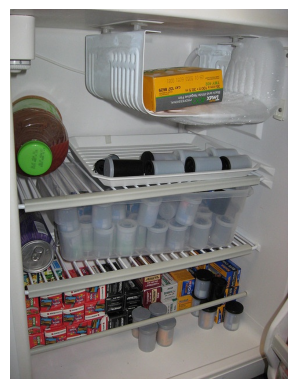

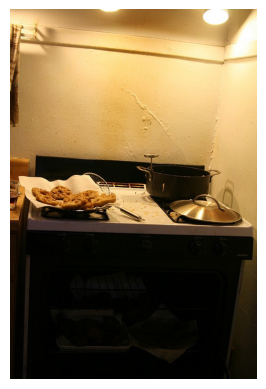

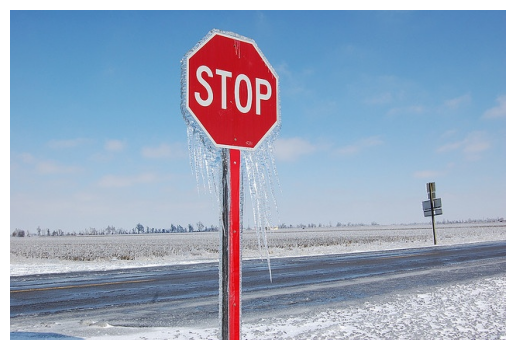

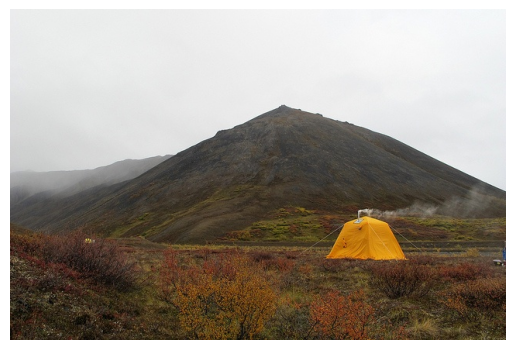

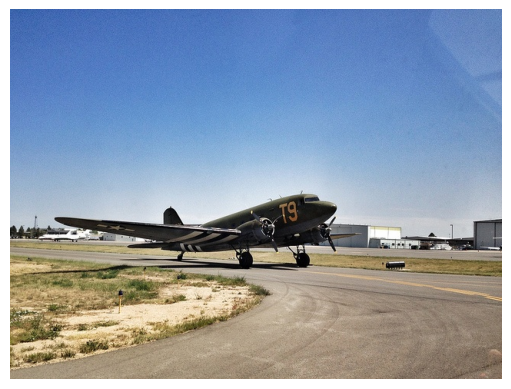

In [7]:
# Menampilkan hasil deteksi pada gambar:
for img_path in test_img_list:
    img = cv2.imread(os.path.join(output_img_dir, os.path.basename(img_path)))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

#### 2. Deteksi pada Video:

In [8]:
# Memuat model yang sudah dilatih sebelumnya (yolov8m.pt):
model = YOLO('/kaggle/input/yolov8m-pretrain-without-train/other/coco2017datasetpersontracking/1/yolov8m.pt')

In [9]:
# Daftar path video yang akan dideteksi:
video_paths = [
    '/kaggle/input/video-for-person-tracking/video.mp4',
    '/kaggle/input/video-for-person-tracking/vecteezy_shopping-street-in-zurich-switzerland_3362832.mov',
    '/kaggle/input/video-for-person-tracking/Street with People Walking at Dusk.mp4',
    '/kaggle/input/video-for-person-tracking/Men Coming to Play Soccer Football.mp4',
    '/kaggle/input/video-for-person-tracking/Goal Play in a Semi Professional Soccer Game.mp4',
    '/kaggle/input/video-for-person-tracking/Couple Walking Hand in Hand.mp4',
    '/kaggle/input/video-for-person-tracking/Bike Ride of a Couple Through a City Park.mp4'
]
output_dir = '/kaggle/working/'  # Direktori untuk menyimpan hasil video

In [10]:
for video_path in video_paths:
    # Membaca video:
    cap = cv2.VideoCapture(video_path)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    output_video_path = os.path.join(output_dir, os.path.basename(video_path).replace('.mov', '_results.mp4'))
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Prediksi pada frame saat ini:
        results = model.predict(frame)
        
        # Filter hasil deteksi untuk class 'person' saja (class ID 0):
        for result in results:
            if result.boxes is not None:
                person_boxes = result.boxes[result.boxes.cls == 0]
                if person_boxes.shape[0] > 0:
                    for box in person_boxes:
                        x1, y1, x2, y2 = [int(coord) for coord in box.xyxy.cpu().numpy()[0]]
                        confidence = box.conf.cpu().numpy()[0]
                        # Menggambar bounding box pada frame dengan warna merah:
                        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 0, 255), 2)
                        
                        # Menambahkan latar belakang untuk teks:
                        text = f'{confidence:.2f}'
                        (w, h), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
                        cv2.rectangle(frame, (x1, y1 - 25), (x1 + w, y1), (0, 0, 255), -1)
                        
                        # Menambahkan teks pada frame:
                        cv2.putText(frame, text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        
        # Menulis frame yang telah diproses ke video output:
        out.write(frame)

    cap.release()
    out.release()

    print(f"Video hasil deteksi disimpan di: {output_video_path}")


0: 384x640 10 persons, 2 cars, 1 traffic light, 2 backpacks, 1 handbag, 1 cup, 25.9ms
Speed: 2.0ms preprocess, 25.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 persons, 2 cars, 1 traffic light, 2 backpacks, 1 handbag, 1 cup, 25.3ms
Speed: 3.0ms preprocess, 25.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 persons, 2 cars, 1 traffic light, 2 backpacks, 1 handbag, 1 cup, 25.5ms
Speed: 3.6ms preprocess, 25.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 10 persons, 1 car, 1 motorcycle, 1 traffic light, 2 backpacks, 1 cup, 25.2ms
Speed: 3.7ms preprocess, 25.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 1 car, 2 traffic lights, 2 backpacks, 2 handbags, 1 cup, 24.8ms
Speed: 3.6ms preprocess, 24.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 persons, 1 car, 1 traffic light, 2 backpacks, 2 handbags, 1 cu

## Validation:

#### Validasi Gambar:

Dengan Gambar dari Luar Dataset COCO 2017:

In [11]:
# Memuat model yang sudah dilatih sebelumnya (yolov8m.pt):
model = YOLO('/kaggle/input/yolov8m-pretrain-without-train/other/coco2017datasetpersontracking/1/yolov8m.pt')

In [12]:
# Path untuk dataset baru:
new_img_dir = '/kaggle/input/images-for-person-tracking'
new_img_name_list = os.listdir(new_img_dir)[:7]
new_img_list = [os.path.join(new_img_dir, i) for i in new_img_name_list]

In [13]:
# Output directory:
output_new_img_dir = '/kaggle/working/yolov8_no_train_new_images'
os.makedirs(output_new_img_dir, exist_ok = True)

In [14]:
# Melakukan prediksi dan menyimpan gambar hasil deteksi:
for img_path in new_img_list:
    img = cv2.imread(img_path)
    results = model(img)
    
    for result in results:
        if result.boxes is not None:
            person_boxes = result.boxes[result.boxes.cls == 0]
            if person_boxes.shape[0] > 0:
                for box in person_boxes:
                    x1, y1, x2, y2 = [int(coord) for coord in box.xyxy.cpu().numpy()[0]]
                    confidence = box.conf.cpu().numpy()[0]
                    # Menggambar bounding box pada gambar dengan warna merah:
                    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
                    
                    # Menambahkan latar belakang untuk teks:
                    text = f'{confidence:.2f}'
                    (w, h), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
                    cv2.rectangle(img, (x1, y1 - 25), (x1 + w, y1), (0, 0, 255), -1)
                    
                    # Menambahkan teks pada gambar:
                    cv2.putText(img, text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
    
    # Menyimpan gambar hasil deteksi:
    output_img_path = os.path.join(output_new_img_dir, os.path.basename(img_path))
    cv2.imwrite(output_img_path, img)


0: 640x448 6 persons, 2 backpacks, 28.0ms
Speed: 2.5ms preprocess, 28.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)

0: 480x640 14 persons, 2 traffic lights, 5 handbags, 28.4ms
Speed: 2.1ms preprocess, 28.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 448x640 7 persons, 3 buss, 2 handbags, 1 sports ball, 26.9ms
Speed: 2.0ms preprocess, 26.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 persons, 2 backpacks, 26.2ms
Speed: 3.1ms preprocess, 26.2ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 18 persons, 1 car, 4 traffic lights, 2 handbags, 26.2ms
Speed: 2.7ms preprocess, 26.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 15 persons, 8 cars, 2 buss, 1 traffic light, 1 bench, 6 handbags, 24.8ms
Speed: 1.9ms preprocess, 24.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 448x640 15 persons, 4 buss, 2 traffic lights, 1 b

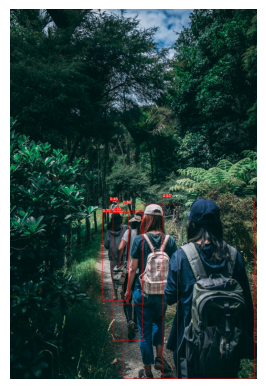

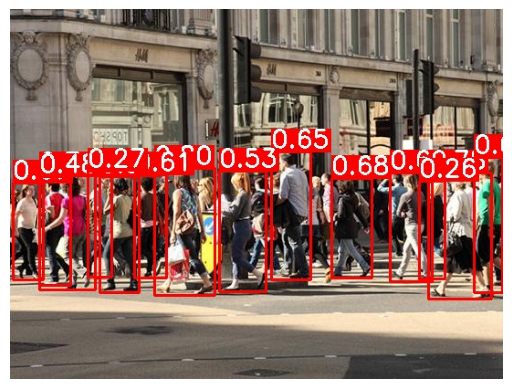

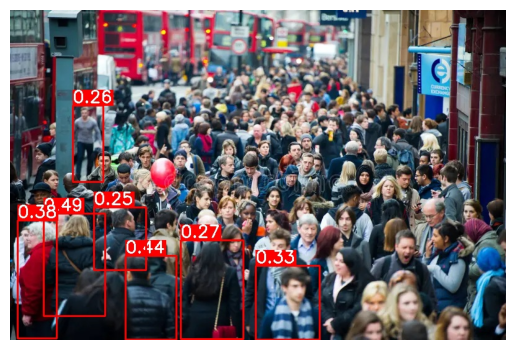

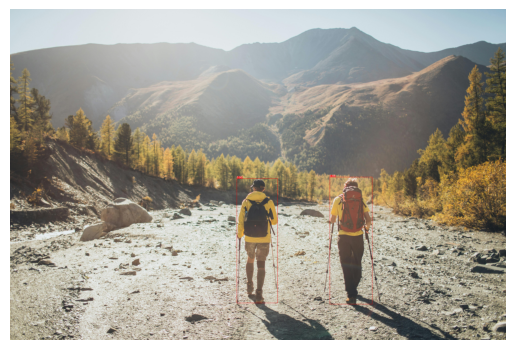

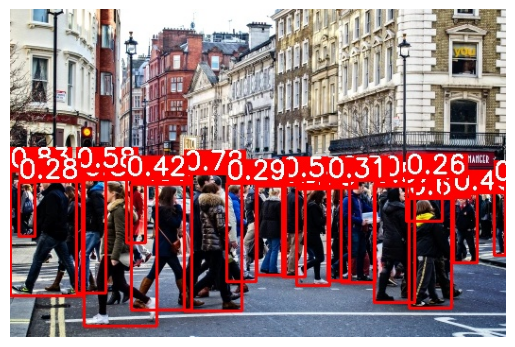

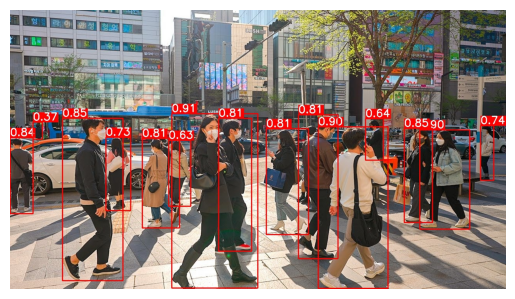

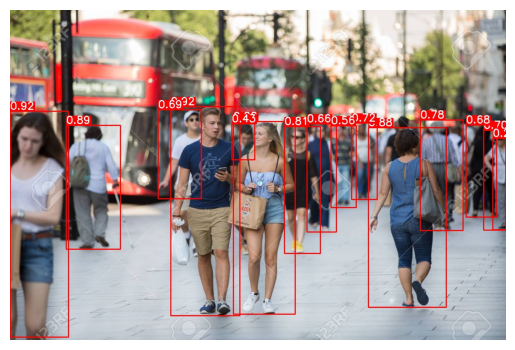

In [15]:
# Menampilkan hasil deteksi pada gambar:
for img_path in new_img_list:
    img = cv2.imread(os.path.join(output_new_img_dir, os.path.basename(img_path)))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()